In [1]:
import pandas as pd
import numpy as np
import pytube

import fasttext.util

fasttext_path = "D:/Fasttext/English/cc.en.300.bin"
fasttext = fasttext.load_model(fasttext_path)

In [2]:
import string
import os
import re
import nltk
import random
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize,sent_tokenize
from sklearn.metrics.pairwise import cosine_similarity

import matplotlib.pyplot as plt

stop_words = set(stopwords.words('english'))

In [3]:
data_path = r"D:\HolisticVideoUnderstanding"
csv_path = os.path.join(data_path, "HVU_Tags_Categories_V1.0.csv")

df = pd.read_csv(csv_path)

In [4]:
df.head(20)

,Tag,Category
0,playing_trombone,action
1,playing_controller,action
2,photograph,action
3,recreation,action
4,sitting,action
5,situp,action
6,playing_recorder,action
7,playing_cello,action
8,playing_flute,action
9,playing_bass_guitar,action


In [5]:
# random video address
df.iloc[0,1]

'action'

In [6]:
## Analyze the classes

In [7]:
main_categories = np.unique(list(df[df.iloc[:,1] == "action"].iloc[:,0]))

In [8]:
for i in range(len(main_categories)):
    main_categories[i] = main_categories[i].replace("_"," ")

main_categories

array(['abseiling', 'acrobatics', 'acting in play', 'adjusting glasses',
       'air drumming', 'alligator wrestling', 'alpine skiing',
       'american football', 'angling', 'answering questions',
       'applauding', 'applying cream', 'archaeological excavation',
       'archery', 'arguing', 'arm wrestling', 'arranging flowers',
       'assembling bicycle', 'assembling computer',
       'attending conference', 'auctioning', 'auto racing',
       'backflip human ', 'baking cookies', 'ball game', 'bandaging',
       'barbequing', 'bartending', 'base jumping', 'baseball',
       'basketball moves', 'bathing', 'bathing dog', 'baton twirling',
       'battle rope training', 'beach soccer', 'beatboxing',
       'bee keeping', 'belly dancing', 'bench pressing', 'bending back',
       'bending metal', 'biking through snow', 'blasting sand',
       'blowdrying hair', 'blowing bubble gum', 'blowing glass',
       'blowing leaves', 'blowing nose', 'blowing out candles', 'bmx',
       'boating',

In [9]:
def preprocess_category_names(c_name):
    
    # lowercase
    c_name = c_name.lower()
    
    # tokenize
    c_name = nltk.word_tokenize(c_name)
    
    c_final =  [word for word in c_name if word not in stopwords.words('english')]
    
    return c_final

In [10]:
def embedding_extractor(w_list):
    
    final_list = [0] * 300
    
    for w in w_list:
        final_list += fasttext[w]
        
    # normalize
    final_list = final_list / len(w_list)
    
    return final_list.reshape(1, -1)

In [11]:
main_categories_embeddings = []

In [12]:
for i in range(len(main_categories)):
    main_categories_embeddings.append(embedding_extractor(preprocess_category_names(main_categories[i])))

In [14]:
main_similarity_matrix = np.zeros((len(main_categories_embeddings), len(main_categories_embeddings)))

for i in range(len(main_categories_embeddings)):
    for j in range(len(main_categories_embeddings)):
        main_similarity_matrix[i,j] = cosine_similarity(main_categories_embeddings[i], main_categories_embeddings[j])

<Figure size 720x720 with 0 Axes>

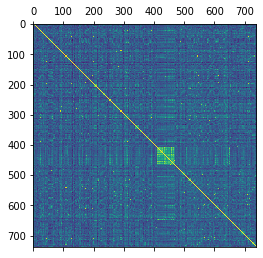

In [15]:
plt.figure(figsize=(10,10))
plt.matshow(main_similarity_matrix,aspect='auto')
plt.show();

In [16]:
most_2_less = []
most_2_less_p = []

In [17]:
for i in range(len(main_categories)):
    list1, list2 = zip(*sorted(zip(main_similarity_matrix[i,:], list(main_categories)), reverse=True))
    most_2_less.append(list2)
    most_2_less_p.append(list1)

In [18]:
for i in range(len(most_2_less)):
    for j in range(len(most_2_less[i])):
        print("{} -- {:.2f}".format(most_2_less[i][j], most_2_less_p[i][j]))
    
    print("\n\n")
    print("----")
    print("\n\n")

abseiling -- 1.00
climbing -- 0.60
skydiving -- 0.56
paragliding -- 0.55
parachuting -- 0.55
climbing a rope -- 0.54
climbing ladder -- 0.51
bungee jumping -- 0.51
canoeing or kayaking -- 0.49
rafting -- 0.47
diving cliff -- 0.46
parasailing -- 0.46
mountain climber exercise  -- 0.45
skipping rope -- 0.45
caving -- 0.45
slacklining -- 0.44
bouldering -- 0.44
trapezing -- 0.44
scuba diving -- 0.42
battle rope training -- 0.42
diving -- 0.41
tobogganing -- 0.41
underwater diving -- 0.41
rock climbing -- 0.40
acrobatics -- 0.39
springboard diving -- 0.39
parkour -- 0.38
spelunking -- 0.38
gliding -- 0.38
rope pushdown -- 0.38
archery -- 0.38
climbing tree -- 0.37
jumping -- 0.37
gymnastics tumbling -- 0.37
kitesurfing -- 0.37
windsurfing -- 0.36
rollerblading -- 0.36
snorkeling -- 0.36
plataform diving -- 0.35
alpine skiing -- 0.35
skiing -- 0.35
cartwheeling -- 0.34
jumping bicycle -- 0.34
snowboarding -- 0.34
using segway -- 0.34
skiing crosscountry -- 0.34
ice climbing -- 0.34
playing 

In [19]:
## K-Means to construct 3-classes with using their embedding matrix

# drop nan class
main_categories_kmeans = list(main_categories)[:-1]
main_categories_embeddings_kmeans = list(main_categories_embeddings)[:-1]

main_categories_embeddings_kmeans = np.array(main_categories_embeddings_kmeans).reshape(738,300)

In [20]:
main_categories_kmeans

['abseiling',
 'acrobatics',
 'acting in play',
 'adjusting glasses',
 'air drumming',
 'alligator wrestling',
 'alpine skiing',
 'american football',
 'angling',
 'answering questions',
 'applauding',
 'applying cream',
 'archaeological excavation',
 'archery',
 'arguing',
 'arm wrestling',
 'arranging flowers',
 'assembling bicycle',
 'assembling computer',
 'attending conference',
 'auctioning',
 'auto racing',
 'backflip human ',
 'baking cookies',
 'ball game',
 'bandaging',
 'barbequing',
 'bartending',
 'base jumping',
 'baseball',
 'basketball moves',
 'bathing',
 'bathing dog',
 'baton twirling',
 'battle rope training',
 'beach soccer',
 'beatboxing',
 'bee keeping',
 'belly dancing',
 'bench pressing',
 'bending back',
 'bending metal',
 'biking through snow',
 'blasting sand',
 'blowdrying hair',
 'blowing bubble gum',
 'blowing glass',
 'blowing leaves',
 'blowing nose',
 'blowing out candles',
 'bmx',
 'boating',
 'bobsledding',
 'bodybuilding',
 'bodysurfing',
 'bookbind

In [21]:
from sklearn.cluster import KMeans
from nltk.cluster import KMeansClusterer

kmeans = KMeansClusterer(3, distance=nltk.cluster.util.euclidean_distance, avoid_empty_clusters=True, repeats=100)
kmeans_labels = kmeans.cluster(main_categories_embeddings_kmeans, assign_clusters=True)

In [22]:
group_1 = []
group_2 = []
group_3 = []

for i in range(len(kmeans_labels)):
    if kmeans_labels[i] == 0:
        group_1.append(main_categories[i])
    elif kmeans_labels[i] == 1:
        group_2.append(main_categories[i])
    elif kmeans_labels[i] == 2:
        group_3.append(main_categories[i])

In [23]:
print(group_1)

['air drumming', 'alpine skiing', 'auto racing', 'bathing dog', 'beach soccer', 'bee keeping', 'biking through snow', 'bmx', 'boating', 'bull fighting', 'calf roping', 'carving ice', 'changing gear in car', 'changing wheel not on bike ', 'cooking egg', 'cycling', 'disc dog', 'disc golfing', 'diving cliff', 'docking boat', 'downhill mountain biking', 'driving car', 'eating cake', 'eating ice cream', 'egg hunting', 'falling off bike', 'feeding fish', 'fishing', 'fly fishing', 'flying kite', 'golf', 'golf chipping', 'golf driving', 'golf putting', 'grooming dog', 'grooming horse', 'hula hooping', 'ice climbing', 'ice fishing', 'ice skating', 'ice swimming', 'land sailing', 'lawn mower racing', 'luge', 'making tea', 'milking cow', 'moon walking', 'mosh pit dancing', 'mountain biking', 'mowing lawn', 'petting animal not cat ', 'petting cat', 'playing beer pong', 'playing ice hockey', 'playing polo', 'playing water polo', 'pouring beer', 'pumping gas', 'purl', 'pushing car', 'rafting', 'ridi

In [36]:
list(set(group_1) - set(train_classes))

['sipping cup',
 'petting cat',
 'spinning poi',
 'lawn mower racing',
 'changing gear in car',
 'riding mule',
 'ice swimming',
 'biking through snow',
 'moon walking',
 'wading through mud',
 'surfing water',
 'auto racing',
 'trail riding',
 'cycling',
 'skiing',
 'yoga',
 'pouring beer',
 'bathing dog',
 'land sailing',
 'carving ice',
 'sled dog racing',
 'egg hunting',
 'driving car',
 'bee keeping',
 'riding camel',
 'golf chipping',
 'ski jumping',
 'golf driving',
 'falling off bike',
 'mosh pit dancing',
 'pushing car',
 'mowing lawn',
 'riding snow blower',
 'sledding',
 'fly fishing',
 'riding mechanical bull',
 'playing ice hockey',
 'tasting food',
 'water skiing',
 'rodeo',
 'disc golfing']

In [24]:
print(group_2)

['abseiling', 'acrobatics', 'acting in play', 'adjusting glasses', 'alligator wrestling', 'american football', 'angling', 'answering questions', 'applauding', 'archaeological excavation', 'archery', 'arguing', 'arranging flowers', 'assembling bicycle', 'assembling computer', 'attending conference', 'auctioning', 'backflip human ', 'baking cookies', 'ball game', 'barbequing', 'bartending', 'baseball', 'basketball moves', 'bathing', 'beatboxing', 'bobsledding', 'bodybuilding', 'bodysurfing', 'bookbinding', 'bottling', 'bouldering', 'bouncing on bouncy castle', 'bouncing on trampoline', 'bowling', 'boxing', 'breading or breadcrumbing', 'breakdancing', 'breaking boards', 'building cabinet', 'building lego', 'building sandcastle', 'bulldozing', 'bungee jumping', 'burping', 'busking', 'calculating', 'calligraphy', 'canoeing or kayaking', 'capoeira', 'capsizing', 'card game', 'card stacking', 'card throwing', 'cartwheeling', 'catching or throwing baseball', 'catching or throwing frisbee', 'ca

In [25]:
print(group_3)

['applying cream', 'arm wrestling', 'bandaging', 'base jumping', 'baton twirling', 'battle rope training', 'belly dancing', 'bench pressing', 'bending back', 'bending metal', 'blasting sand', 'blowdrying hair', 'blowing bubble gum', 'blowing glass', 'blowing leaves', 'blowing nose', 'blowing out candles', 'braiding hair', 'breathing fire', 'brush painting', 'brushing hair', 'brushing teeth', 'building shed', 'carrying baby', 'carving pumpkin', 'casting fishing line', 'catching fish', 'changing oil', 'checking tires', 'chewing gum', 'chiseling stone', 'chiseling wood', 'chopping meat', 'chopping vegetables', 'chopping wood', 'clam digging', 'clay pottery making', 'clean and jerk', 'cleaning gutters', 'cleaning shoes', 'cleaning toilet', 'climbing a rope', 'climbing tree', 'clipping cat claws', 'combing hair', 'cracking back', 'cracking knuckles', 'cracking neck', 'crawling baby', 'cross', 'crossing eyes', 'curling hair', 'cutting apple', 'cutting nails', 'cutting orange', 'cutting pinea

## Download File Preparation

In [26]:
# select: 64 for training
#         12 for validation
#         24 for testing

train_classes = random.sample(group_1, 64)
validation_classes = random.sample(group_2, 12)
test_classes = random.sample(group_3, 24)

In [27]:
test_classes

['ironing',
 'putting on mascara',
 'clean and jerk',
 'sucking lolly',
 'feeding goats',
 'using circular saw',
 'threading needle',
 'juggling fire',
 'drumming fingers',
 'bending back',
 'battle rope training',
 'putting on lipstick',
 'belly dancing',
 'applying cream',
 'water sliding',
 'raking leaves',
 'hammer throw',
 'cleaning toilet',
 'high jump',
 'front raises',
 'long jump',
 'peeling apples',
 'head stand',
 'push up']

In [38]:
len(train_classes),len(validation_classes),len(test_classes)

(64, 12, 24)

In [29]:
data_path

'D:\\HolisticVideoUnderstanding'

In [30]:
# Read the train csv to obtain video ids
df_hvu_train = pd.read_csv(os.path.join(data_path, "HVU_Train_V1.0.csv"))

In [31]:
df_hvu_train.head()

,Tags,youtube_id,time_start,time_end
0,brass_instrument|musical_instrument|trumpet|wo...,OLpWTpTC4P8,57.0,67.0
1,gadget|electronic_musical_instrument|electroni...,pjj6zedpCQY,75.0,85.0
2,photograph|joint|shoulder|nature|human_leg|fun...,_STSOsITd0E,3.0,13.0
3,mouth|child|fun|nose|hair|human_hair_color|hea...,0r_BGL3416g,406.0,416.0
4,photograph|violist|cellist|violin_family|night...,xsPKW4tZZBc,233.0,243.0


In [39]:
# get video id's for each class

train_v_ids = []
val_v_ids = []
test_v_ids = []

for elem in train_classes:
    
    class_all_v_ids = df_hvu_train.youtube_id[df_hvu_train["Tags"].str.contains(elem.replace(" ","_"))].dropna().unique().tolist()
    
    try:
        v_ids = random.sample(class_all_v_ids, 150)
    except:
        print("Train")
        print(elem)
    
    train_v_ids.append(v_ids)
    
for elem in validation_classes:
    
    class_all_v_ids = df_hvu_train.youtube_id[df_hvu_train["Tags"].str.contains(elem.replace(" ","_"))].dropna().unique().tolist()
    
    try:
        v_ids = random.sample(class_all_v_ids, 150)
    except:
        print("Val")
        print(elem)

    
    val_v_ids.append(v_ids)

for elem in test_classes:
    
    class_all_v_ids = df_hvu_train.youtube_id[df_hvu_train["Tags"].str.contains(elem.replace(" ","_"))].dropna().unique().tolist()
    
    try:
        v_ids = random.sample(class_all_v_ids, 150)
    except:
        print("Test")
        print(elem)

    
    test_v_ids.append(v_ids) 

In [42]:
np.array(train_v_ids).shape, np.array(val_v_ids).shape, np.array(test_v_ids).shape

((64, 150), (12, 150), (24, 150))

In [47]:
# get all data for each video link
train_df = []
val_df = []
test_df = []

for i in range(len(train_v_ids)):
    class_name = train_classes[i]
    
    class_df = df_hvu_train[df_hvu_train["youtube_id"].isin(train_v_ids[i])]
    class_df["action_name"] = [class_name] * len(class_df)
    
    train_df.append(class_df)

for i in range(len(val_v_ids)):
    class_name = validation_classes[i]
    
    class_df = df_hvu_train[df_hvu_train["youtube_id"].isin(val_v_ids[i])]
    class_df["action_name"] = [class_name] * len(class_df)
    
    val_df.append(class_df)

for i in range(len(test_v_ids)):
    class_name = test_classes[i]
    
    class_df = df_hvu_train[df_hvu_train["youtube_id"].isin(test_v_ids[i])]
    class_df["action_name"] = [class_name] * len(class_df)
    
    test_df.append(class_df)

C:\Users\PC\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\Users\PC\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\PC\Anaconda3\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the 

### Save them for download purposes

In [48]:
df_save_path = "C:/Users/PC/Desktop/FewShotPhd/data_hvu/hvu_classes/" 

train_all_df = pd.concat(train_df)
val_all_df = pd.concat(val_df)
test_all_df = pd.concat(test_df)

# save train
train_all_df.to_csv(df_save_path + 'train_df.csv', index=False)

# save validation
val_all_df.to_csv(df_save_path + 'val_df.csv', index=False)

# save test
test_all_df.to_csv(df_save_path + 'test_df.csv', index=False)

In [49]:
# read the saved file
df_saved = pd.read_csv("C:/Users/PC/Desktop/FewShotPhd/data_hvu/hvu_classes/val_df.csv", index_col=False)

df_saved.head(20)

,Tags,youtube_id,time_start,time_end,action_name
0,artwork|animal_source_foods|neck|bratwurst|mea...,b2Hr_YH-a3E,74.0,84.0,making a sandwich
1,clothing|daytime|mouth|child|fun|arm|human_leg...,joYDrgp03Z0,66.0,76.0,making a sandwich
2,meal|service|fun|brunch|cooking|dish|breakfast...,rVl3Vv2Irrg,310.0,320.0,making a sandwich
3,asian_food|street_food|service|supper|brunch|c...,XK7whmklL-c,61.0,71.0,making a sandwich
4,arm|service|produce|dish|junk_food|making_a_sa...,8zfe-f47YLA,189.0,199.0,making a sandwich
5,kitchen|meal|cookware_and_bakeware|furniture|c...,xlqJhAOKW6Y,39.0,49.0,making a sandwich
6,toppings|sandwich|animal_source_foods|meal|mea...,-mY6ImS5rgc,282.0,292.0,making a sandwich
7,cool|skin|child|tartan|arm|joint|eating|dish|m...,SCdnTy93Kak,19.0,29.0,making a sandwich
8,drink|distilled_beverage|meal|brunch|cooking|d...,P6Xl7J-G9Ho,47.0,57.0,making a sandwich
9,glasses|fun|cheese|animal_fat|cooking|bread|di...,A9QuDxPkpAQ,29.0,39.0,making a sandwich
